In [4]:
import scanpy as sc
import anndata as ad
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sns
import numpy as np
import skimage

In [5]:
sc.set_figure_params(dpi=80, color_map='viridis')
sc.settings.verbosity = 4
sc.logging.print_versions()

-----
anndata     0.10.7
scanpy      1.10.1
-----
PIL                 10.3.0
appnope             0.1.4
asttokens           NA
cffi                1.16.0
comm                0.2.2
cycler              0.12.1
cython_runtime      NA
dateutil            2.9.0
debugpy             1.6.7
decorator           5.1.1
executing           2.0.1
h5py                3.11.0
igraph              0.11.4
ipykernel           6.29.3
jedi                0.19.1
joblib              1.4.0
kiwisolver          1.4.5
lazy_loader         0.4
legacy_api_wrap     NA
leidenalg           0.10.2
llvmlite            0.42.0
matplotlib          3.8.4
matplotlib_inline   0.1.7
mpl_toolkits        NA
natsort             8.4.0
numba               0.59.1
numpy               1.26.4
packaging           23.1
pandas              2.2.2
parso               0.8.4
patsy               0.5.6
pickleshare         0.7.5
pkg_resources       NA
platformdirs        3.10.0
prompt_toolkit      3.0.42
psutil              5.9.8
pure_eval          

# Load in scRNA-seq data

In [3]:
ad_scrna_path = "/Users/amulyagarimella/Downloads/compproj/AD_scRNA/RNA_processed_degs.h5ad"
ft_scrna_path = "/Users/amulyagarimella/Downloads/compproj/FT_scRNA/099f4685-5df8-4f27-93bc-58dd02803d62.h5ad"
ovary_scrna_path = "/Users/amulyagarimella/Downloads/compproj/Ovary_scRNA/175bd243-8f1d-436d-a0a4-482d50fa4309.h5ad"

In [4]:
ad_adata = sc.read_h5ad(ad_scrna_path)
ft_adata = sc.read_h5ad(ft_scrna_path)
ovary_adata = sc.read_h5ad(ovary_scrna_path)

# Visualize datasets independently

Text(0, 0.5, 'UMAP2')

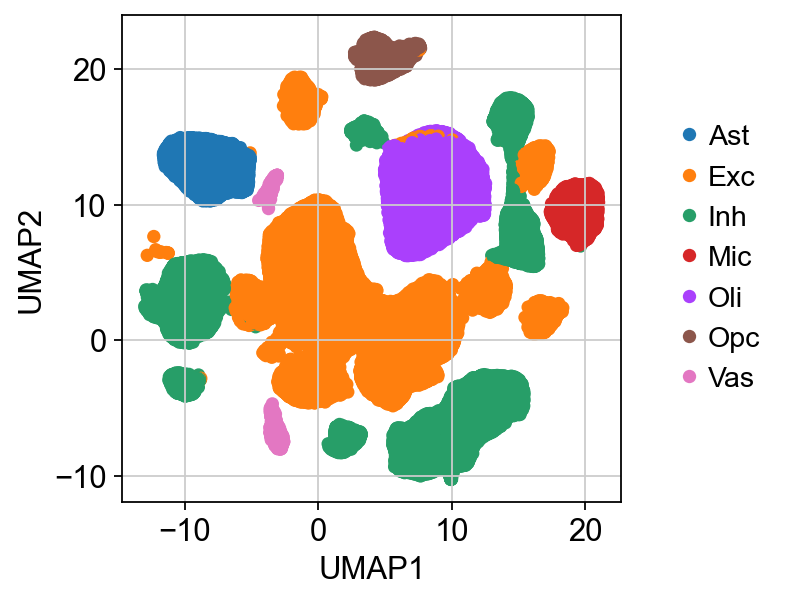

In [300]:
sns.scatterplot(x=ad_adata.obs['U1'], y=ad_adata.obs['U2'], hue=ad_adata.obs['major.celltype'], linewidth=0)
plt.legend(bbox_to_anchor=[1.2, .5], loc='center',frameon=False)
plt.xlabel("UMAP1")
plt.ylabel("UMAP2")

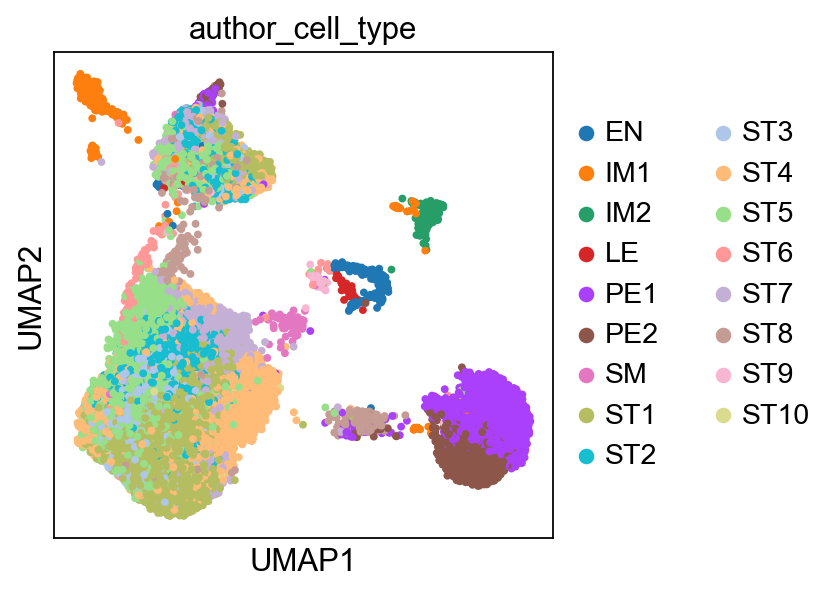

In [301]:
sc.pl.umap(ovary_adata, color=['author_cell_type'], s=50)

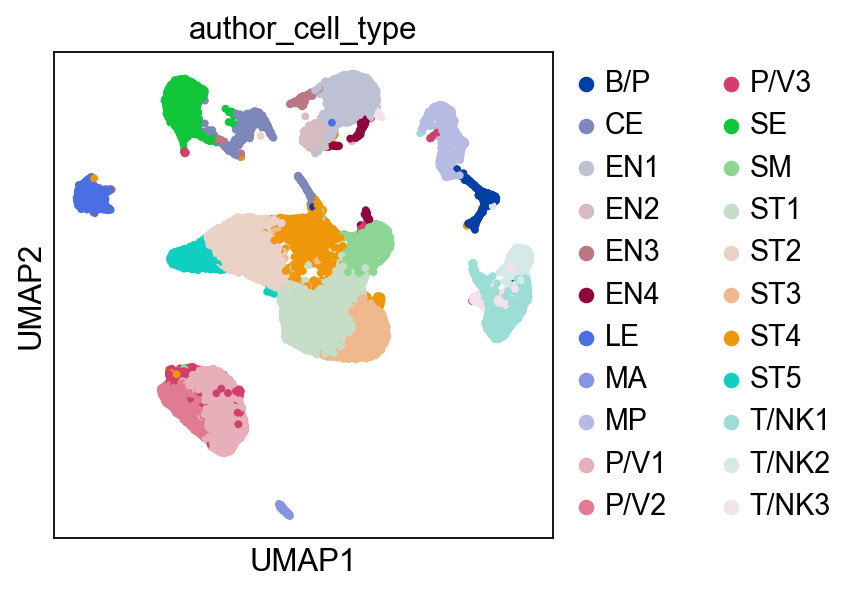

In [11]:
sc.pl.umap(ft_adata, color=['author_cell_type'], s=50)

# QC, preprocessing

## General code

In [115]:
min_genes = 200
min_cells=3
max_mito=.20
target_sum_norm=1e4
n_top_genes=2000
resolutions=[0.02, 0.5, 2.0]
    

In [62]:
# Generate packet of QC visualizations
def qc_viz(adata, n_counts_key="n_counts", n_genes_key="n_genes", pct_mito_key = "pct_mito", pc_check = [["msex", "batch", "pct_ribo", "pct_mito"]], umap_check = [["major.celltype","batch"], ["subject"]], resolutions=[0.02, 0.5, 2.0]):
    sc.pl.violin(
        adata,
        [n_counts_key, n_genes_key, pct_mito_key],
        jitter=0.4,
        multi_panel=True,
    )
    sc.pl.scatter(adata, n_counts_key, n_genes_key, color=pct_mito_key)
    sc.pl.scatter(adata, n_counts_key, pct_mito_key) # TODO
    sc.pl.highly_variable_genes(adata)
    sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)
    if len(pc_check) > 0:
        for p in pc_check:
            sc.pl.pca(
                adata,
                color=p,
                dimensions=[(0, 1)]*len(p),
                ncols=int(np.ceil(len(p)/2)),
                size=2,
            )
    
    if len(umap_check) > 0:
        for u in umap_check:
            sc.pl.umap(
                adata,
                color=u,
                # Setting a smaller point size to get prevent overlap
                size=2,
                ncols=int(np.ceil(len(u)/2)),
            )

    leiden_res = [f"leiden_res_{res:4.2f}" for res in resolutions]
    sc.pl.umap(
        adata,
        color=leiden_res,
        legend_loc="on data",
    )

## AD

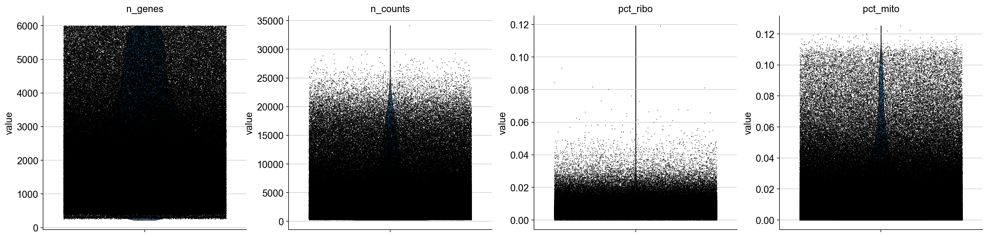

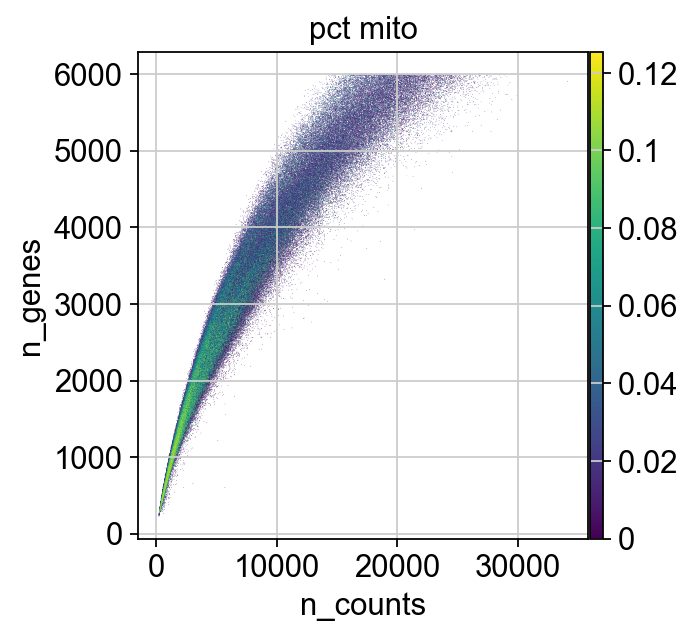

In [5]:
sc.pl.violin(
    ad_adata,
    ["n_genes", "n_counts", "pct_ribo", "pct_mito"],
    jitter=0.4,
    multi_panel=True,
)
sc.pl.scatter(ad_adata, "n_counts", "n_genes", color="pct_mito")

In [6]:
# QC suggested by scanpy tutorial
# permissive filtering strategy
sc.pp.filter_cells(ad_adata, min_genes=200)
sc.pp.filter_genes(ad_adata, min_cells=3)
ad_adata.layers["counts"] = ad_adata.X.copy()

Below we replicate QC steps in the original paper.

In [8]:
# Normalizing to median total counts - 10K
sc.pp.normalize_total(ad_adata, target_sum = 1e4)
# Logarithmize the data
sc.pp.log1p(ad_adata)

normalizing counts per cell
    finished (0:00:21)


In [9]:
sc.pp.highly_variable_genes(ad_adata, n_top_genes=5000, batch_key="batch")

extracting highly variable genes
    finished (0:00:38)


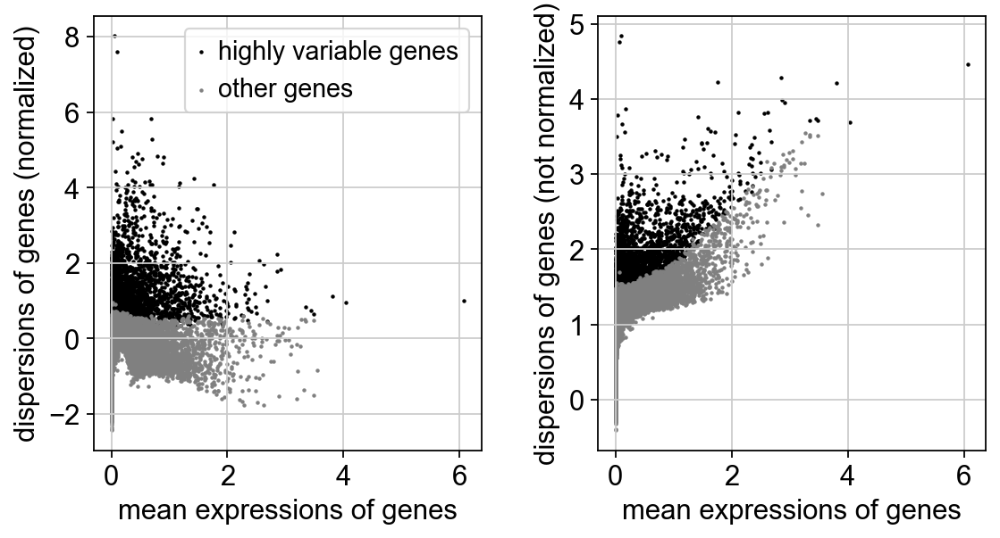

In [10]:
sc.pl.highly_variable_genes(ad_adata)

In [11]:
sc.tl.pca(ad_adata)

computing PCA
    with n_comps=50
    finished (0:00:56)


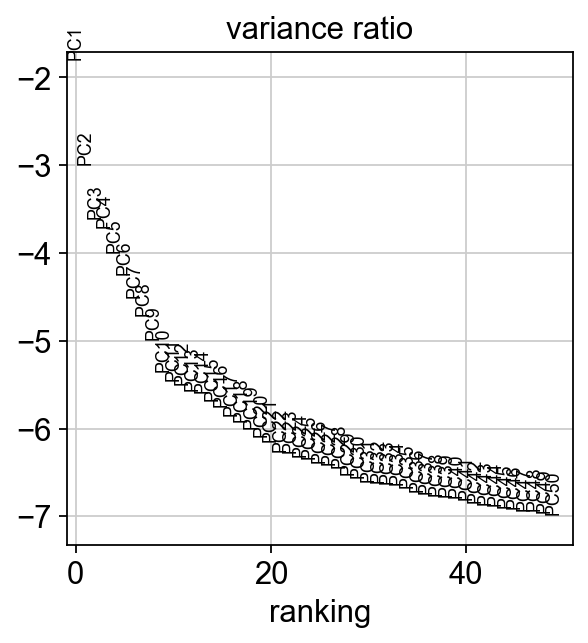

In [12]:
sc.pl.pca_variance_ratio(ad_adata, n_pcs=50, log=True)

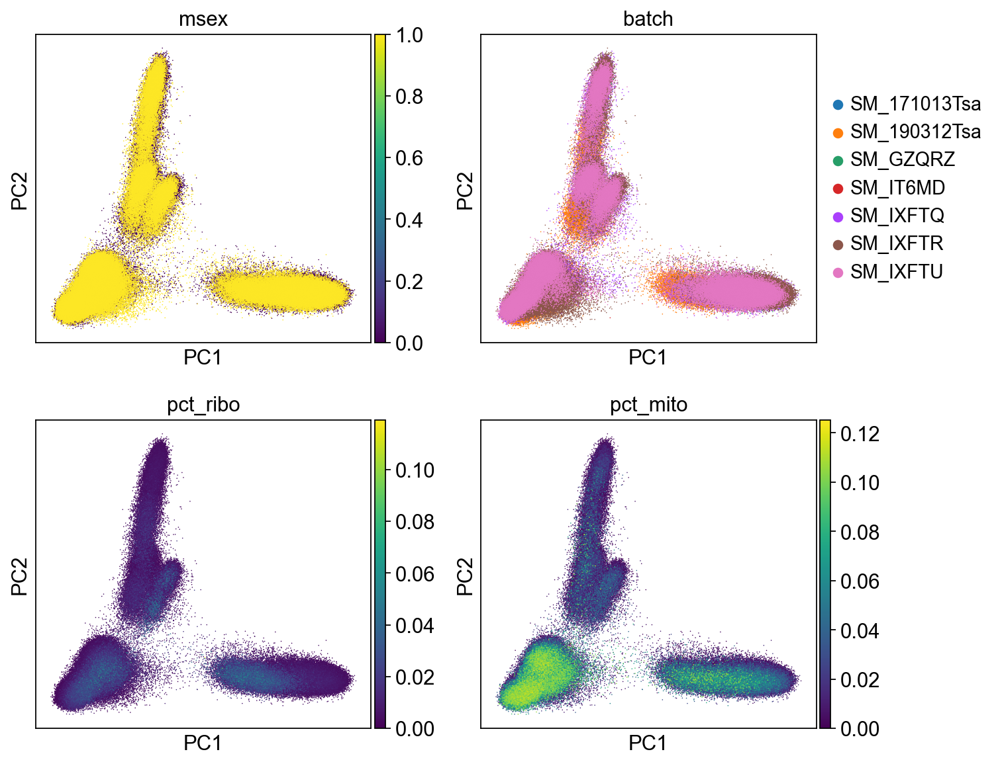

In [13]:
sc.pl.pca(
    ad_adata,
    color=["msex", "batch", "pct_ribo", "pct_mito"],
    dimensions=[(0, 1), (0, 1), (0, 1), (0, 1)],
    ncols=2,
    size=2,
)

In [15]:
sc.pp.neighbors(ad_adata)

computing neighbors
    using 'X_pca' with n_pcs = 50


/opt/homebrew/Caskroom/miniconda/base/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


    finished (0:00:43)


In [16]:
sc.tl.umap(ad_adata)

computing UMAP
    finished (0:03:35)


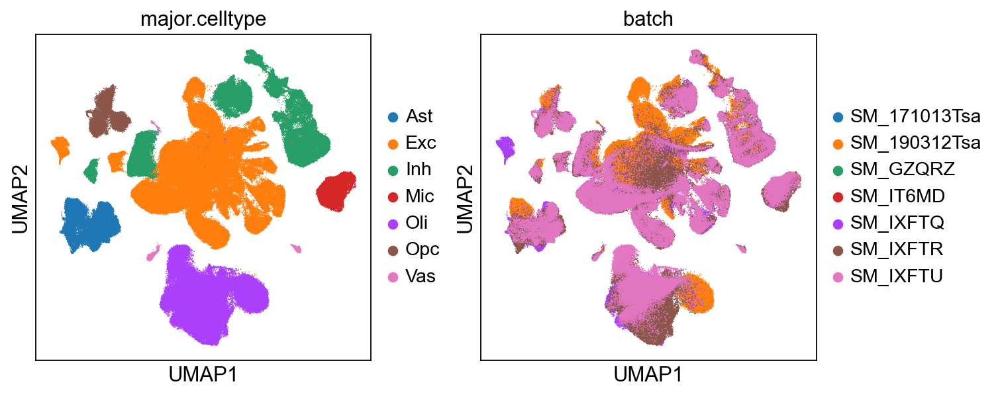

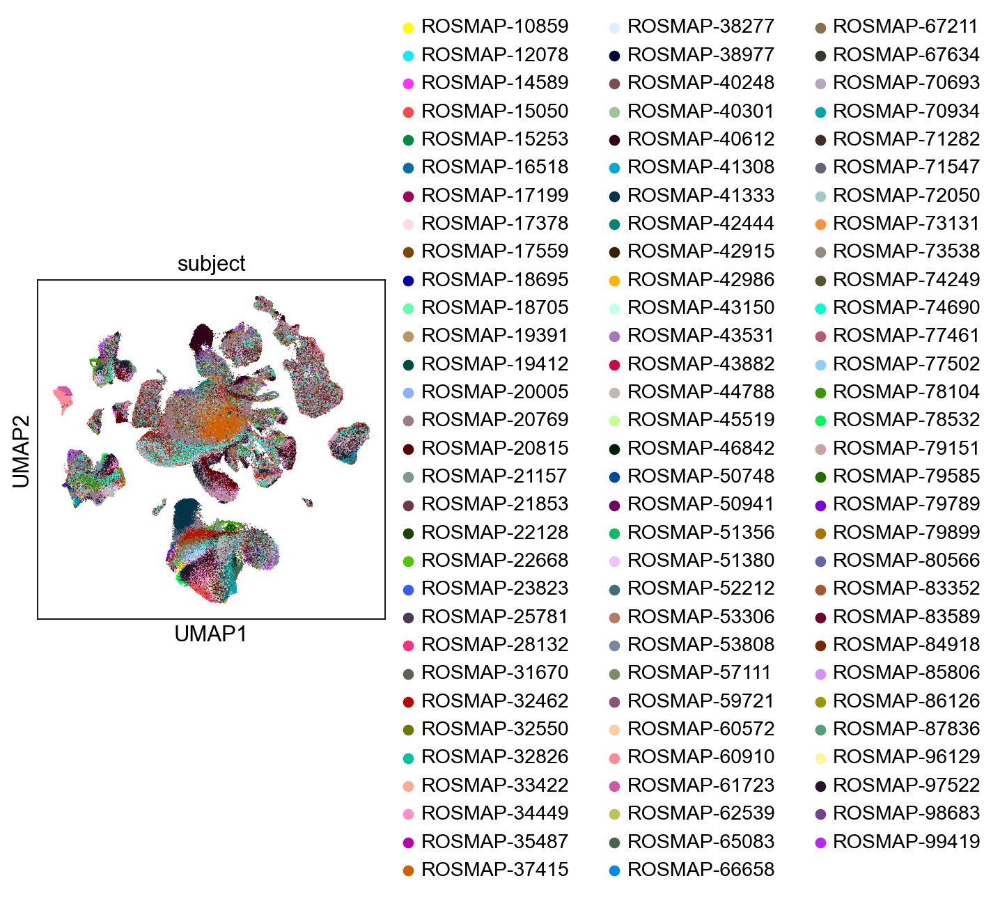

In [54]:
sc.pl.umap(
    ad_adata,
    color=["major.celltype","batch"],
    # Setting a smaller point size to get prevent overlap
    size=2,
    ncols=2
)

sc.pl.umap(
    ad_adata,
    color=["subject"],
    # Setting a smaller point size to get prevent overlap
    size=2,
    ncols=1,
)

In [20]:
for res in [0.02, 0.5, 2.0]:
    sc.tl.leiden(
        ad_adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )

running Leiden clustering
    finished (0:00:10)
running Leiden clustering
    finished (0:00:09)
running Leiden clustering
    finished (0:00:10)


In [21]:
ad_adata.write("/Users/amulyagarimella/Downloads/compproj/AD_scRNA/RNA_processed.h5ad")

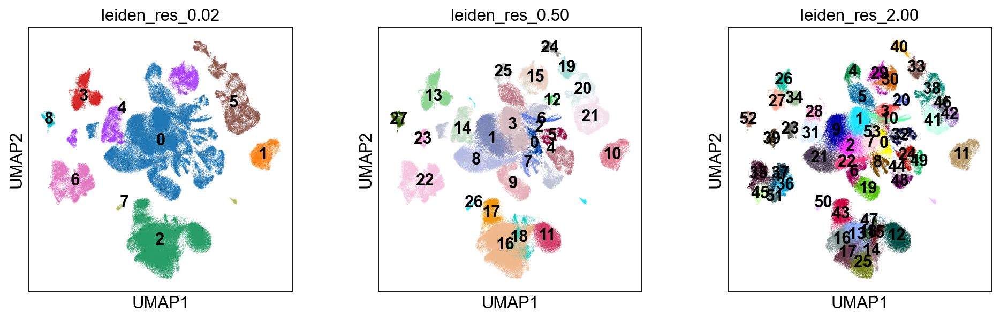

In [22]:
sc.pl.umap(
    ad_adata,
    color=["leiden_res_0.02", "leiden_res_0.50", "leiden_res_2.00"],
    legend_loc="on data",
)

## Fallopian tube

In [133]:
ft_scrna_path

'/Users/amulyagarimella/Downloads/compproj/FT_scRNA/099f4685-5df8-4f27-93bc-58dd02803d62.h5ad'

In [139]:
ft_adata = sc.read_h5ad(ft_scrna_path)

In [142]:
sc.pp.filter_cells(ft_adata, min_genes=min_genes)
sc.pp.filter_genes(ft_adata, min_cells=min_cells)
ft_adata.layers["counts"] = ft_adata.X.copy()
sc.pp.scrublet(ft_adata,batch_key="sample_uuid")

# Normalizing to median total counts - 10K
sc.pp.normalize_total(ft_adata, target_sum = target_sum_norm,inplace=True)
# Logarithmize the data
sc.pp.log1p(ft_adata)
sc.pp.highly_variable_genes(ft_adata, n_top_genes=n_top_genes, batch_key="sample_uuid",inplace=True)
sc.tl.pca(ft_adata, copy=False)
sc.pp.neighbors(ft_adata,copy=False)
sc.tl.umap(ft_adata,copy=False)
for res in resolutions:
    sc.tl.leiden(
        ft_adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )

filtered out 2 cells that have less than 200 genes expressed
filtered out 33309 genes that are detected in less than 3 cells
Running Scrublet
filtered out 14864 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    Gene indices [ 5284  9972 11184] fell into a single bin: their normalized dispersion was set to 1.
    Decreasing `n_bins` will likely avoid this effect.
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
Embedding transcriptomes using PCA...
    computing neighbors
    using data matrix X directly
    computed neighbors (0:00:00)
Automatically set threshold at doublet score = 0.23
Detected doublet rate = 0.2%
Estimated detectable double

  2%|▏         | 4/200 [00:00<00:16, 11.59it/s]

	completed  0  /  200 epochs


 12%|█▏        | 23/200 [00:02<00:17,  9.91it/s]

	completed  20  /  200 epochs


 21%|██        | 42/200 [00:04<00:16,  9.81it/s]

	completed  40  /  200 epochs


 31%|███       | 62/200 [00:06<00:14,  9.83it/s]

	completed  60  /  200 epochs


 42%|████▏     | 83/200 [00:08<00:12,  9.70it/s]

	completed  80  /  200 epochs


 51%|█████     | 102/200 [00:10<00:10,  9.76it/s]

	completed  100  /  200 epochs


 61%|██████    | 122/200 [00:12<00:08,  9.75it/s]

	completed  120  /  200 epochs


 71%|███████   | 142/200 [00:14<00:05,  9.84it/s]

	completed  140  /  200 epochs


 81%|████████  | 162/200 [00:16<00:04,  9.46it/s]

	completed  160  /  200 epochs


 91%|█████████ | 182/200 [00:18<00:01,  9.73it/s]

	completed  180  /  200 epochs


100%|██████████| 200/200 [00:20<00:00,  9.77it/s]

    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:23)
running Leiden clustering


    finished: found 5 clusters and added
    'leiden_res_0.02', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 18 clusters and added
    'leiden_res_0.50', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 39 clusters and added
    'leiden_res_2.00', the cluster labels (adata.obs, categorical) (0:00:01)


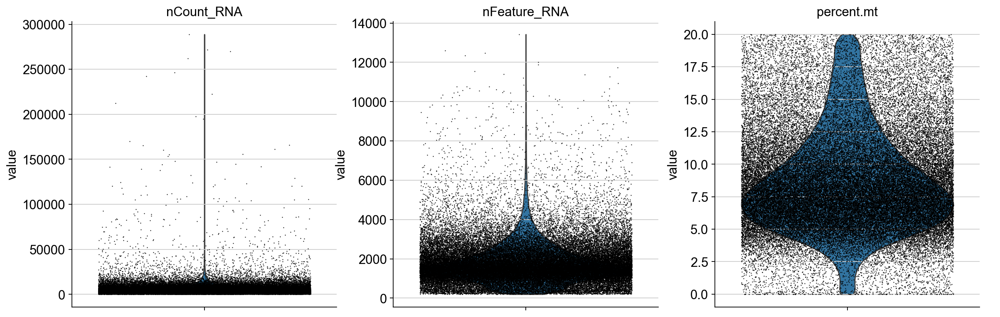

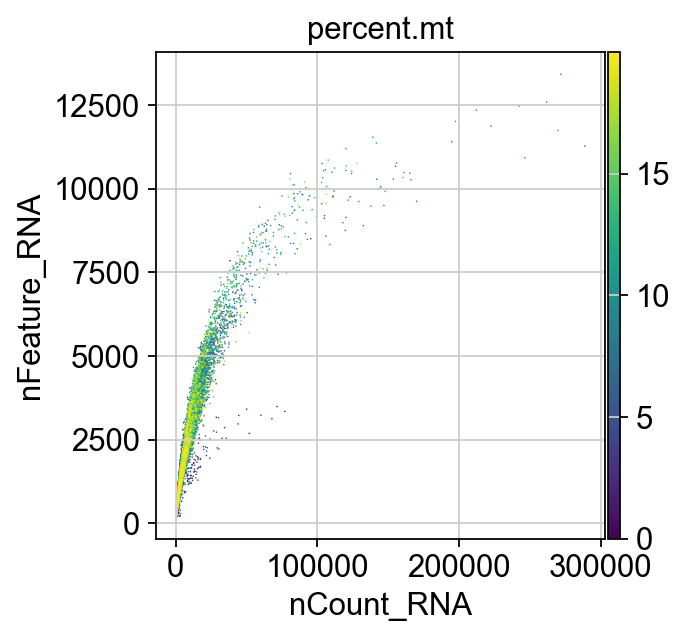

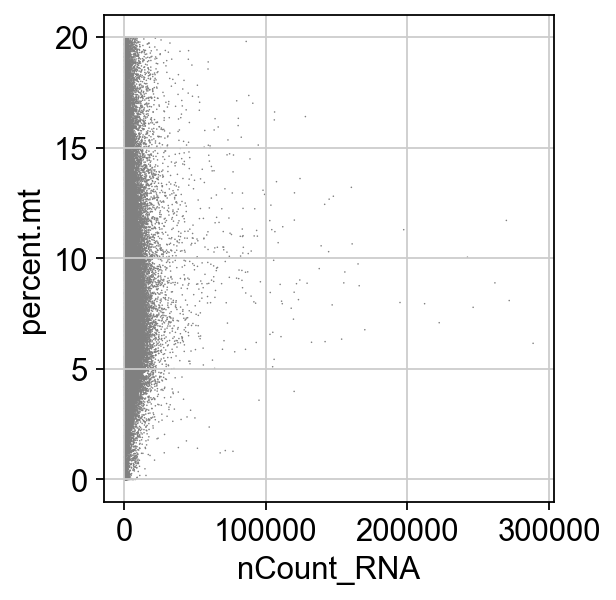

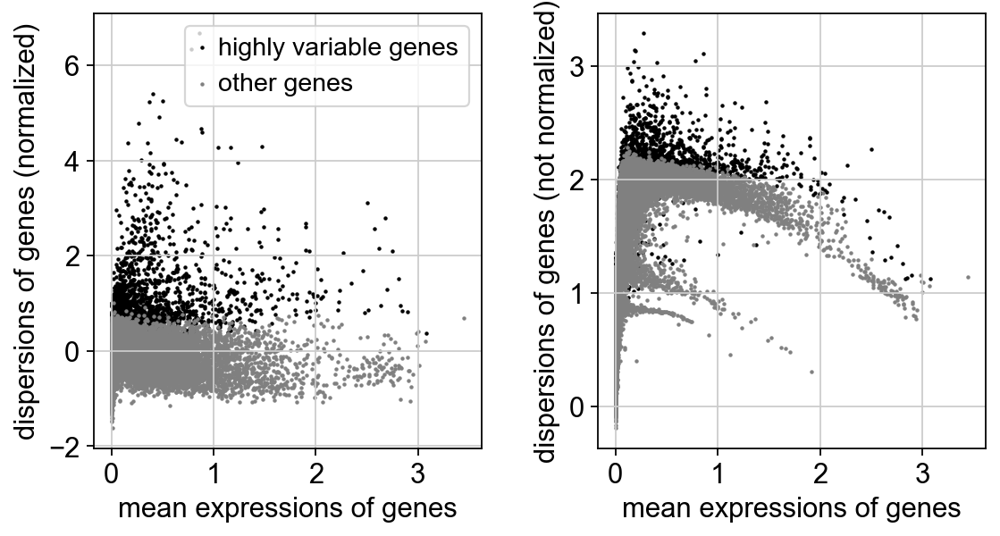

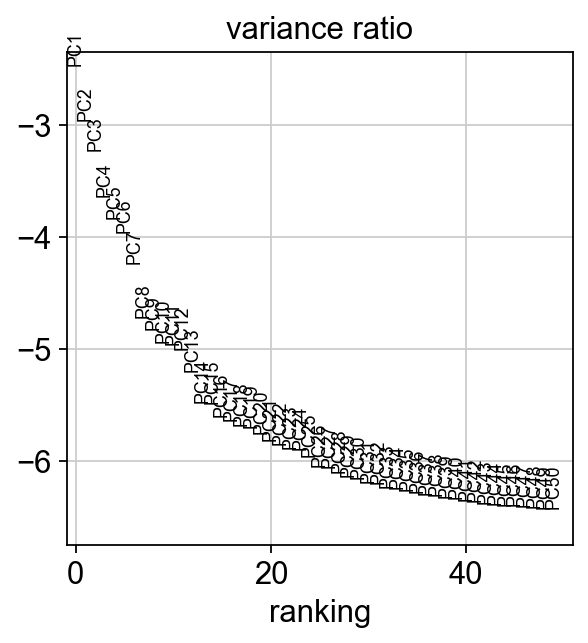

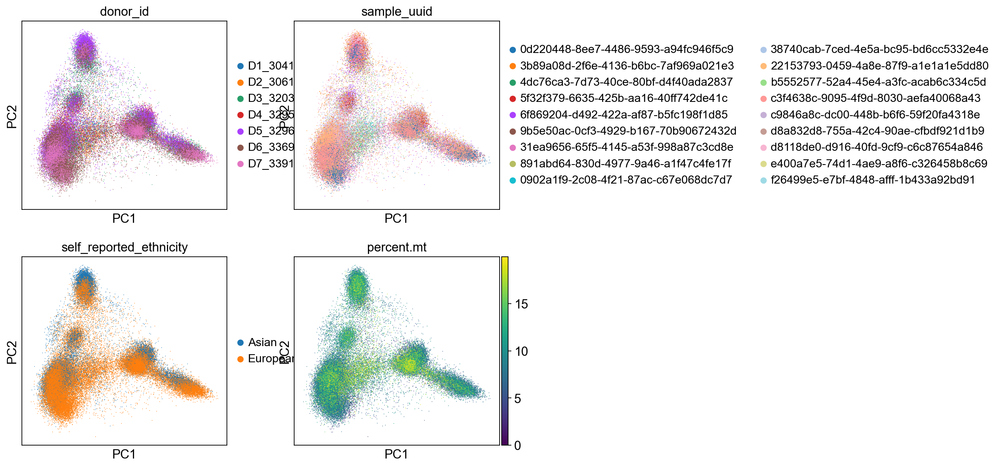

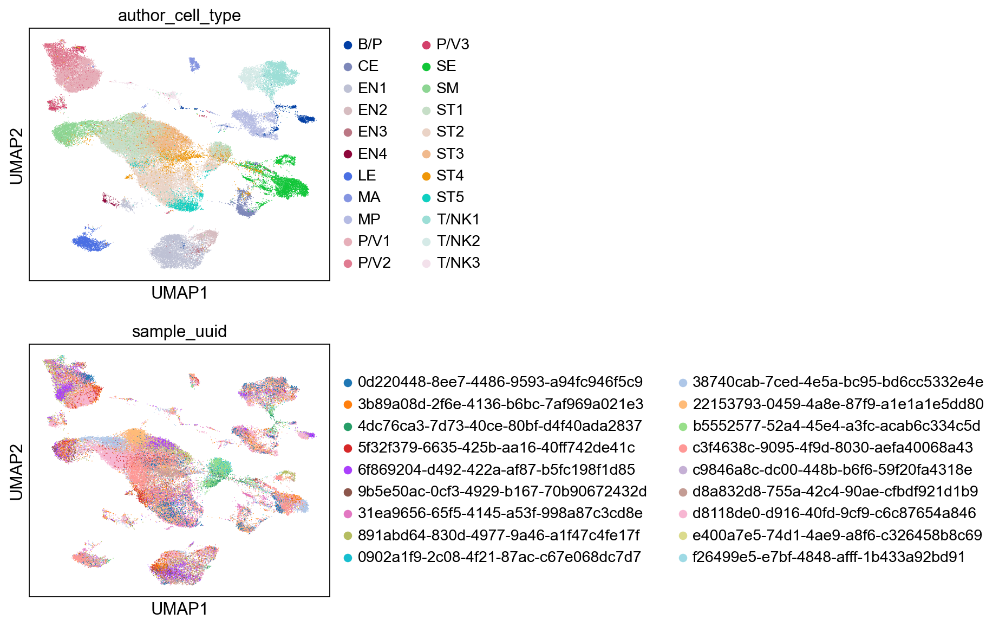

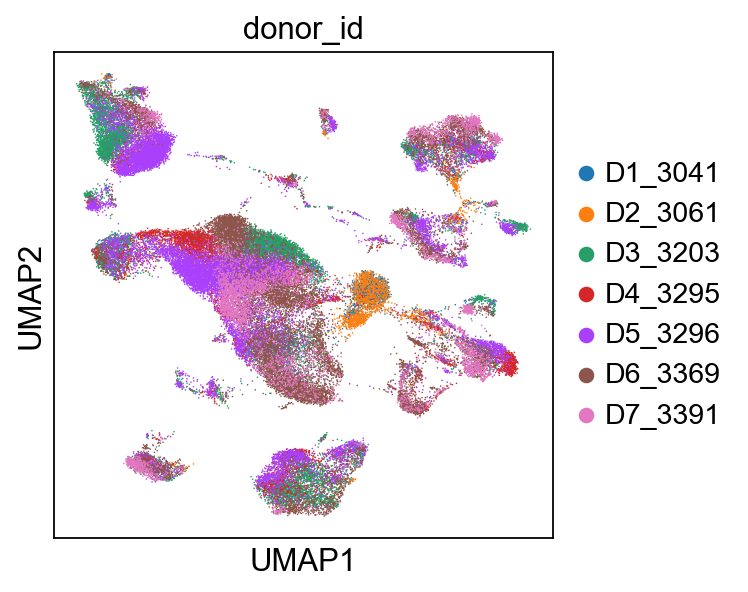

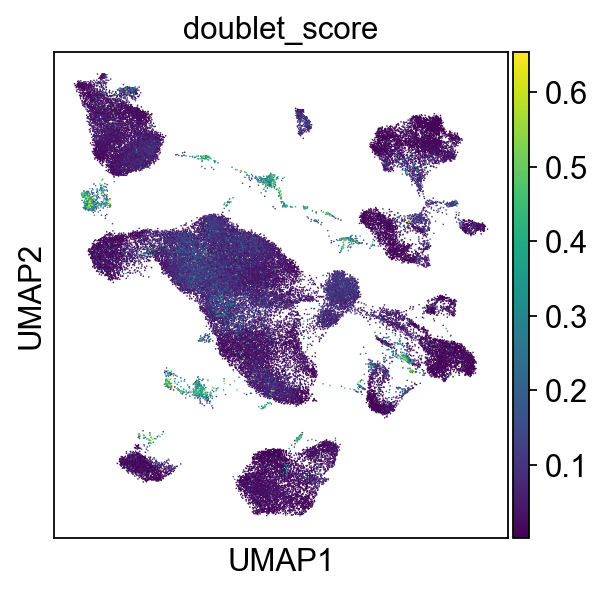

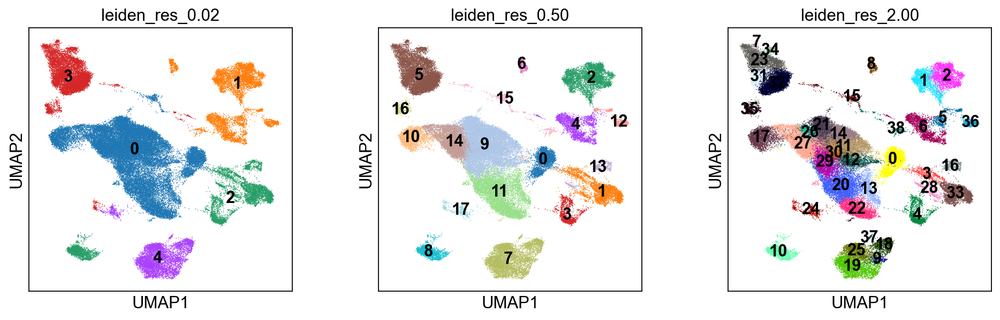

In [144]:
qc_viz(ft_adata, n_counts_key="nCount_RNA", n_genes_key="nFeature_RNA", pct_mito_key = "percent.mt", pc_check = [["donor_id", "sample_uuid", "self_reported_ethnicity", "percent.mt"]], umap_check = [["author_cell_type","sample_uuid"], ["donor_id"],["doublet_score"]], resolutions=[0.02, 0.5, 2.0])

In [146]:
ft_adata.write("/Users/amulyagarimella/Downloads/compproj/FT_scRNA/RNA_processed.h5ad")

## Ovary

In [114]:
ovary_adata

AnnData object with n_obs × n_vars = 26129 × 23447
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'sex_ontology_term_id', 'expCond', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'n_genes', 'doublet_score', 'predicted_doublet'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'n_cells'
    uns: 'citation', 'default_embedding', 'schema_reference', 'schema_version', 'title', 'scrublet'
    obsm: 'X_pca', 'X_tsne', 'X_umap'

In [143]:
sc.pp.filter_cells(ovary_adata, min_genes=min_genes)
sc.pp.filter_genes(ovary_adata, min_cells=min_cells)
ovary_adata.layers["counts"] = ovary_adata.X.copy()
sc.pp.scrublet(ovary_adata,batch_key="sample_uuid")

# Normalizing to median total counts - 10K
sc.pp.normalize_total(ovary_adata, target_sum = target_sum_norm,inplace=True)
# Logarithmize the data
sc.pp.log1p(ovary_adata)
sc.pp.highly_variable_genes(ovary_adata, n_top_genes=n_top_genes, batch_key="sample_uuid",inplace=True)
sc.tl.pca(ovary_adata, copy=False)
sc.pp.neighbors(ovary_adata,copy=False)
sc.tl.umap(ovary_adata,copy=False)
for res in resolutions:
    sc.tl.leiden(
        ovary_adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )

Running Scrublet
filtered out 10438 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    Gene indices [10497 12036] fell into a single bin: their normalized dispersion was set to 1.
    Decreasing `n_bins` will likely avoid this effect.
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
Embedding transcriptomes using PCA...
    computing neighbors
    using data matrix X directly
    computed neighbors (0:00:01)
Automatically set threshold at doublet score = 0.31
Detected doublet rate = 0.1%
Estimated detectable doublet fraction = 0.8%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 15.4%
filtered out 3775 genes that are detected in less th

  4%|▍         | 8/200 [00:00<00:09, 19.80it/s]

	completed  0  /  200 epochs


 13%|█▎        | 26/200 [00:01<00:07, 21.82it/s]

	completed  20  /  200 epochs


 24%|██▎       | 47/200 [00:02<00:06, 22.53it/s]

	completed  40  /  200 epochs


 34%|███▍      | 68/200 [00:03<00:05, 22.59it/s]

	completed  60  /  200 epochs


 43%|████▎     | 86/200 [00:03<00:05, 22.57it/s]

	completed  80  /  200 epochs


 54%|█████▎    | 107/200 [00:04<00:04, 22.45it/s]

	completed  100  /  200 epochs


 64%|██████▍   | 128/200 [00:05<00:03, 22.43it/s]

	completed  120  /  200 epochs


 73%|███████▎  | 146/200 [00:06<00:02, 21.21it/s]

	completed  140  /  200 epochs


 84%|████████▎ | 167/200 [00:07<00:01, 22.33it/s]

	completed  160  /  200 epochs


 94%|█████████▍| 188/200 [00:08<00:00, 22.42it/s]

	completed  180  /  200 epochs


100%|██████████| 200/200 [00:09<00:00, 21.90it/s]

    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)
running Leiden clustering


    finished: found 4 clusters and added
    'leiden_res_0.02', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden_res_0.50', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 22 clusters and added
    'leiden_res_2.00', the cluster labels (adata.obs, categorical) (0:00:00)


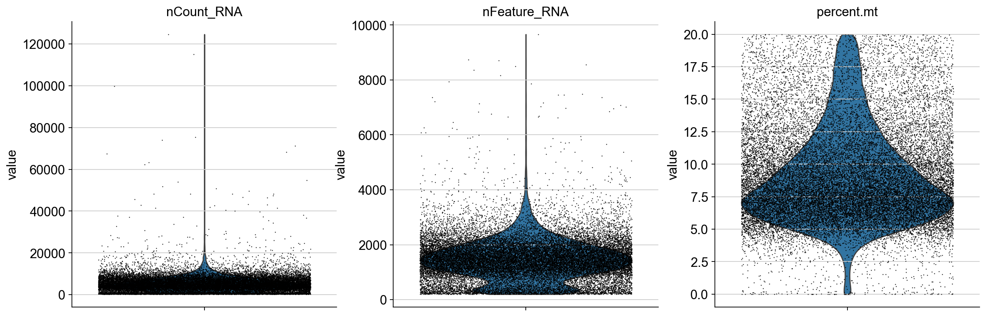

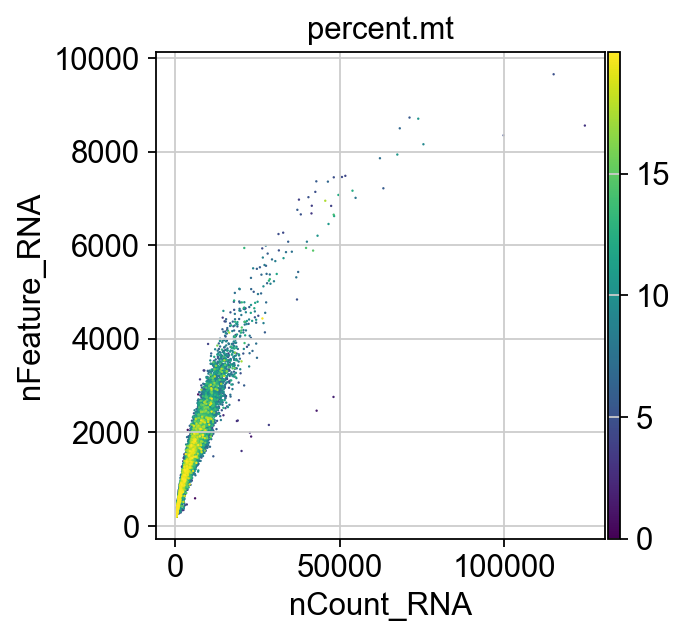

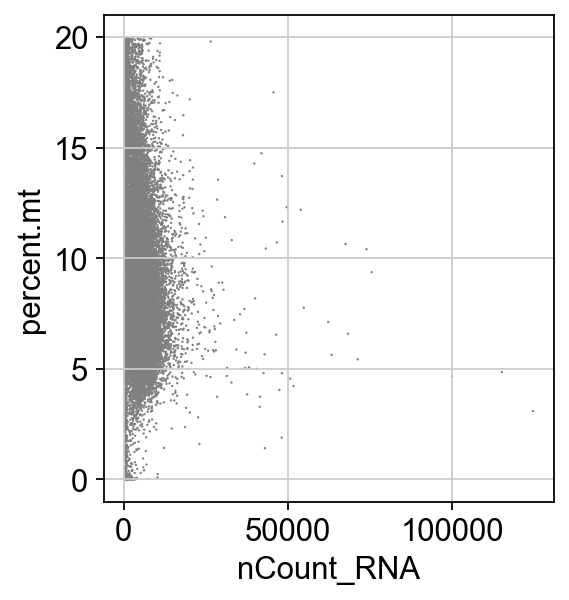

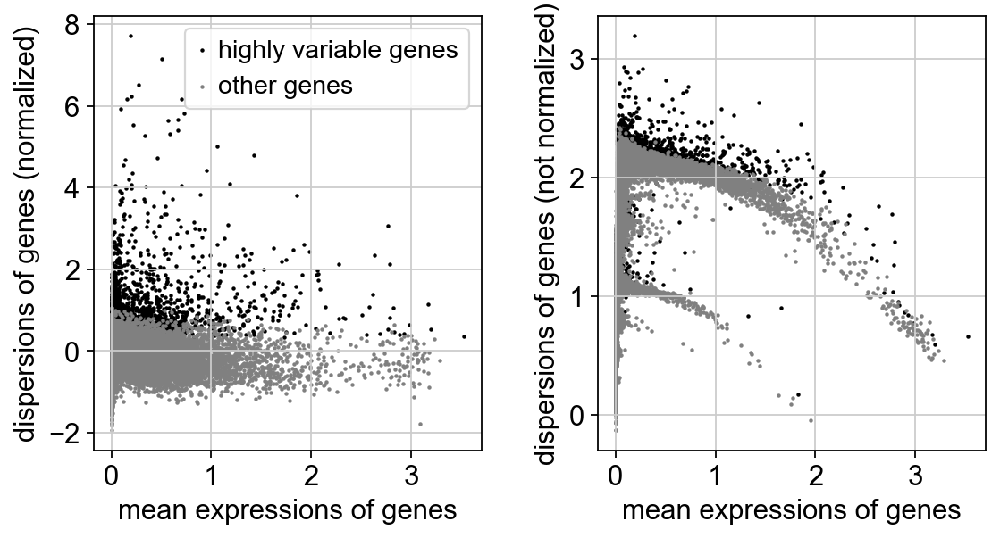

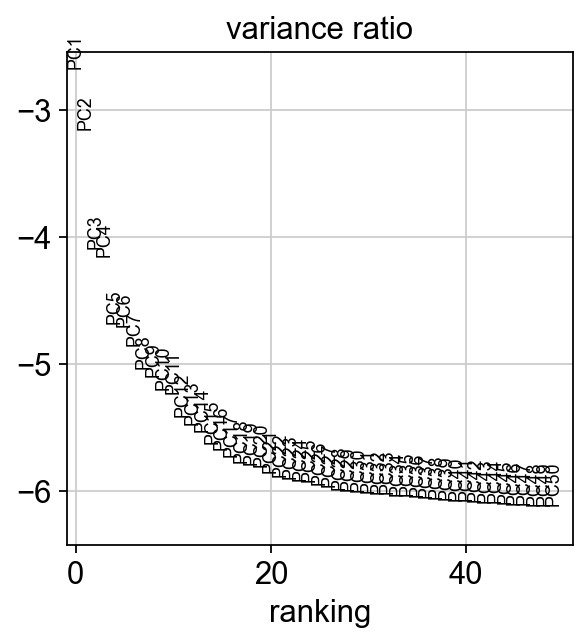

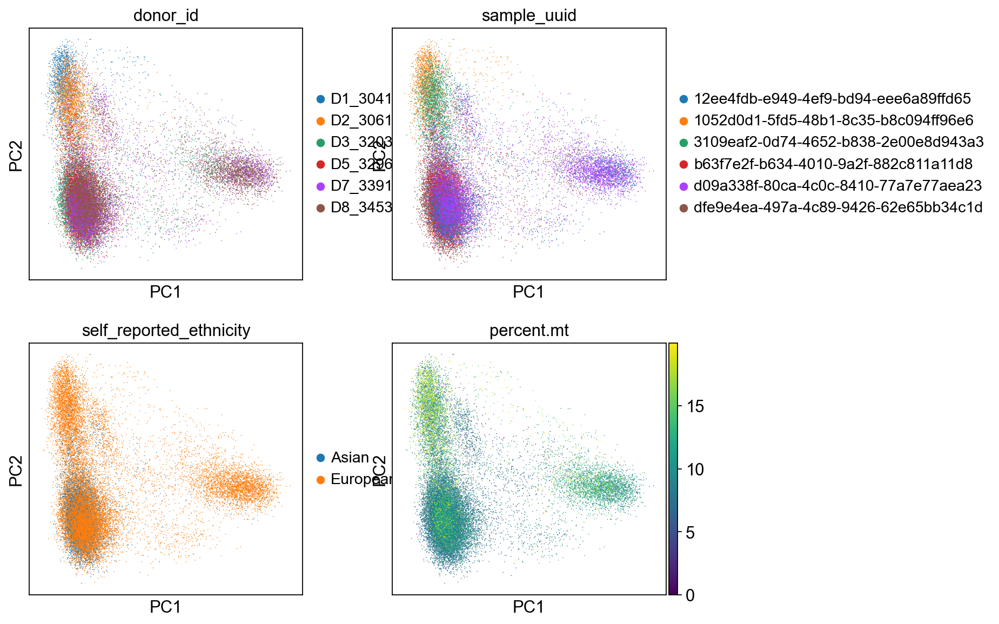

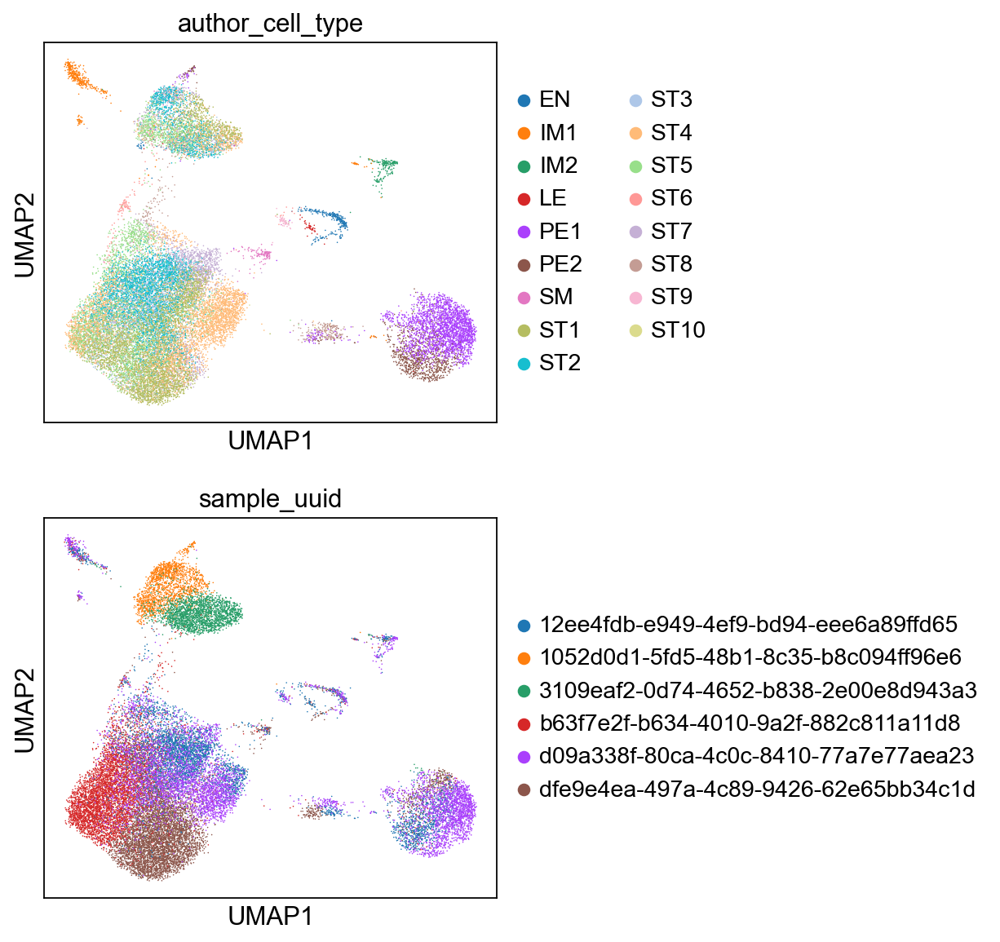

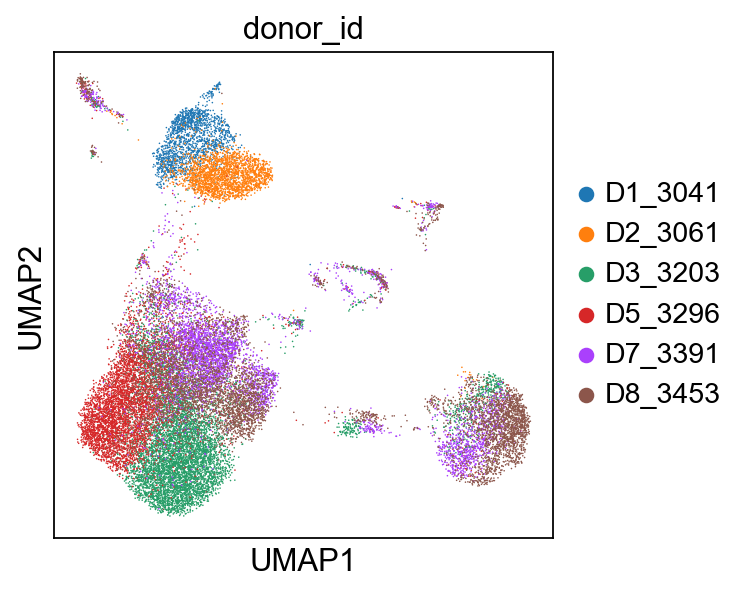

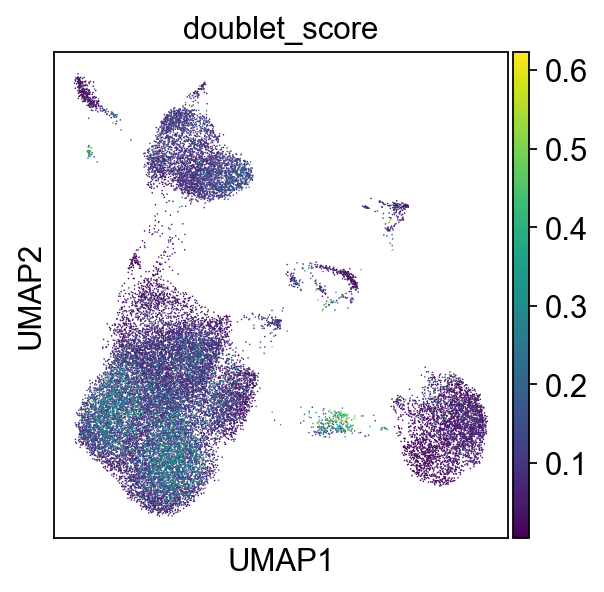

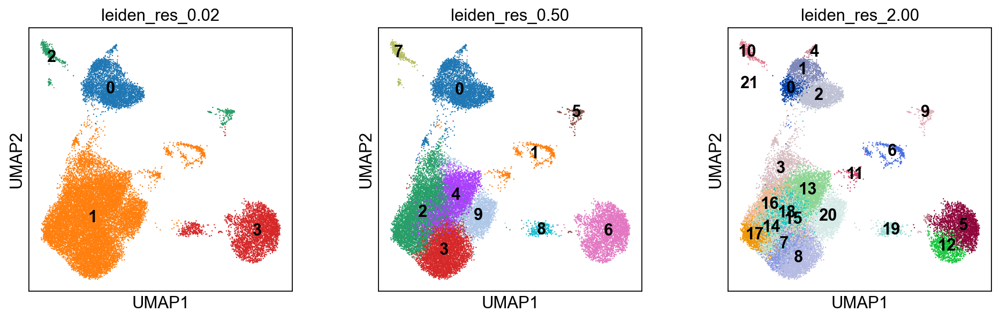

In [147]:
qc_viz(ovary_adata, n_counts_key="nCount_RNA", n_genes_key="nFeature_RNA", pct_mito_key = "percent.mt", pc_check = [["donor_id", "sample_uuid", "self_reported_ethnicity", "percent.mt"]], umap_check = [["author_cell_type","sample_uuid"], ["donor_id"],["doublet_score"]], resolutions=[0.02, 0.5, 2.0])

In [145]:
ovary_adata.write("/Users/amulyagarimella/Downloads/compproj/Ovary_scRNA/RNA_processed.h5ad")

# Find DEGs for each cell type within each tissue

In [23]:
sc.tl.rank_genes_groups(ad_adata, groupby="major.celltype")
ad_adata.write("/Users/amulyagarimella/Downloads/compproj/AD_scRNA/RNA_processed_degs.h5ad")
# see scanpy_downstream.ipynb

ranking genes


KeyboardInterrupt: 

In [157]:
sc.tl.rank_genes_groups(ft_adata, groupby="author_cell_type",use_raw=False)
# https://stackoverflow.com/questions/68292862/performancewarning-dataframe-is-highly-fragmented-this-is-usually-the-result-o
ft_adata.write("/Users/amulyagarimella/Downloads/compproj/FT_scRNA/RNA_processed_degs.h5ad")

ranking genes
    consider 'author_cell_type' groups:
    with sizes: [  800  1127  4826   778   176   147  1523   428  2213  6369  2058  1022
  3614  2987 11694  7299  4947  2256  1497  3051  1438   322]
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:10)


/opt/homebrew/Caskroom/miniconda/base/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:429: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/opt/homebrew/Caskroom/miniconda/base/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:431: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/opt/homebrew/Caskroom/miniconda/base/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:434

In [155]:
sc.tl.rank_genes_groups(ovary_adata, groupby="author_cell_type",use_raw=False)
ovary_adata.write("/Users/amulyagarimella/Downloads/compproj/Ovary_scRNA/RNA_processed_degs.h5ad")

ranking genes
    consider 'author_cell_type' groups:
    with sizes: [ 291  421  170   47 2578  905  150 5136 4544  995 4731 3365  198 1991
  490   68   49]
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


# Overlaps

In [6]:
ad_adata = sc.read("/Users/amulyagarimella/Downloads/compproj/AD_scRNA/RNA_processed_degs.h5ad")
ft_adata = sc.read("/Users/amulyagarimella/Downloads/compproj/FT_scRNA/RNA_processed_degs.h5ad")
ovary_adata = sc.read("/Users/amulyagarimella/Downloads/compproj/Ovary_scRNA/RNA_processed_degs.h5ad")

In [8]:
from supervenn import supervenn
import pybiomart

from pybiomart import Server

server = Server(host='http://www.ensembl.org')
dataset = (server.marts['ENSEMBL_MART_ENSEMBL']
                 .datasets['hsapiens_gene_ensembl'])

mapping=dataset.query(attributes=['ensembl_gene_id', 'external_gene_name','hgnc_symbol'])

def map_and_qual (input, from_key, to_key):
    mapped = mapping.loc[mapping[from_key].isin(input)][to_key]
    olen = len(set(input))
    mlen = len(set(mapped))
    print(f"Didn't map over: {(olen-mlen)/olen}")
    return mapped

In [9]:
ad_degs = sc.get.rank_genes_groups_df(ad_adata, group=None)
ad_degs_sig = ad_degs.loc[ad_degs["pvals_adj"] < 0.05]['names']

ft_degs = sc.get.rank_genes_groups_df(ft_adata, group=None)
ft_degs_sig = ft_degs.loc[ft_degs["pvals_adj"] < 0.05]['names']

ovary_degs = sc.get.rank_genes_groups_df(ovary_adata, group=None)
ovary_degs_sig = ovary_degs.loc[ovary_degs["pvals_adj"] < 0.05]['names']


We have AD degs as gene symbols/names and ovary/FT degs as Ensembl IDs, so need to map identifiers one way or the other.

In [12]:
ad_degs_sig_mapped = map_and_qual(ad_degs_sig, "Gene name","Gene stable ID")
ft_degs_sig_mapped_r = map_and_qual(ft_degs_sig,"Gene stable ID", "Gene name")
ovary_degs_sig_mapped_r = map_and_qual(ovary_degs_sig,"Gene stable ID", "Gene name")

Didn't map over: 0.23298349812708805
Didn't map over: 0.18447209830163575
Didn't map over: 0.15392993283717554


We have ~20% loss of data either way, but less so when we map FT/ovary.

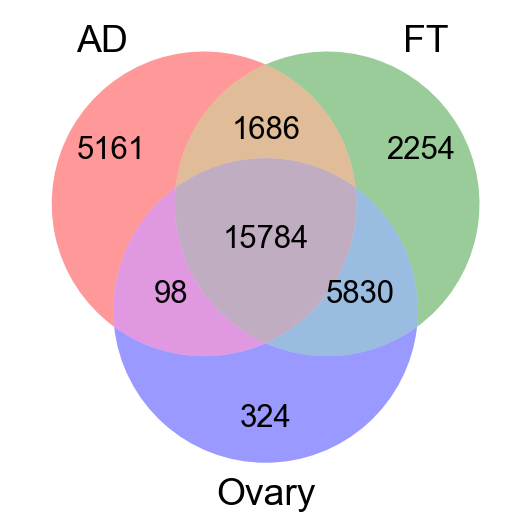

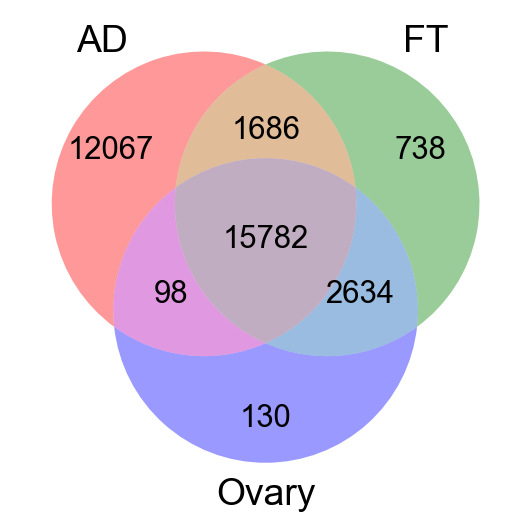

<Figure size 320x320 with 0 Axes>

In [13]:
from matplotlib_venn import venn3,venn3_unweighted

# use unweighted venn to better see overlaps
venn3_unweighted([set(ad_degs_sig_mapped), set(ft_degs_sig),set(ovary_degs_sig)],("AD","FT","Ovary"))
plt.show()
plt.clf()

venn3_unweighted([set(ad_degs_sig), set(ft_degs_sig_mapped_r),set(ovary_degs_sig_mapped_r)],("AD","FT","Ovary"))
plt.show()
plt.clf()

We see no matter how we map, our intersection numbers are on the same order. Notably different is FT-ovary, which makes sense because the second mapping schemes results in loss in both gene sets.

In [ ]:
# TODO use overlapping peaks!

## Further exploration of overlaps

### AD-ovary-FT

In [19]:
ad_ovary_ft_overlaps = set(ad_degs_sig_mapped).intersection(set(ft_degs_sig)).intersection(set(ovary_degs_sig))

### AD-FT

In [20]:
ad_ft_overlaps = set(ad_degs_sig_mapped).intersection(set(ft_degs_sig))

### AD-ovary

In [21]:
ad_ovary_overlaps = set(ad_degs_sig_mapped).intersection(set(ovary_degs_sig))

# Joint plotting

In [299]:
# TODO